In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
sophatvathana_casia_dataset_path = kagglehub.dataset_download('sophatvathana/casia-dataset')
saurabhshahane_cg1050_path = kagglehub.dataset_download('saurabhshahane/cg1050')

print('Data source import complete.')


Data source import complete.


In [ ]:
import tensorflow as tf
import keras

print("TensorFlow version:", tf.__version__)
print("Keras version:", keras.__version__)

# **Preprocessing**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

In [ ]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [ ]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'

    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)

    ela_image = ImageChops.difference(image, temp_image)

    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff

    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)

    return ela_image

In [ ]:
import tensorflow as tf
class Config:
    CASIA1 = "/kaggle/input/casia-dataset/CASIA1"
    CASIA2 = "/kaggle/input/casia-dataset/CASIA2"
    autotune = tf.data.experimental.AUTOTUNE
    epochs = 30
    batch_size = 32
    lr = 1e-3
    name = 'xception'
    n_labels = 2
    image_size = (224, 224)
    decay = 1e-6
    momentum = 0.95
    nesterov = False

In [ ]:
def compute_ela_cv(path, quality):
    temp_filename = 'temp_file_name.jpg'
    SCALE = 15
    orig_img = cv2.imread(path)
    orig_img = cv2.cvtColor(orig_img, cv2.COLOR_BGR2RGB)

    cv2.imwrite(temp_filename, orig_img, [cv2.IMWRITE_JPEG_QUALITY, quality])

    # read compressed image
    compressed_img = cv2.imread(temp_filename)

    # get absolute difference between img1 and img2 and multiply by scale
    diff = SCALE * cv2.absdiff(orig_img, compressed_img)
    return diff

In [ ]:
def random_sample(path, extension=None):
    if extension:
        items = Path(path).glob(f'*.{extension}')
    else:
        items = Path(path).glob(f'*')

    items = list(items)

    p = random.choice(items)
    return p.as_posix()

# **Test on a Authentic image**

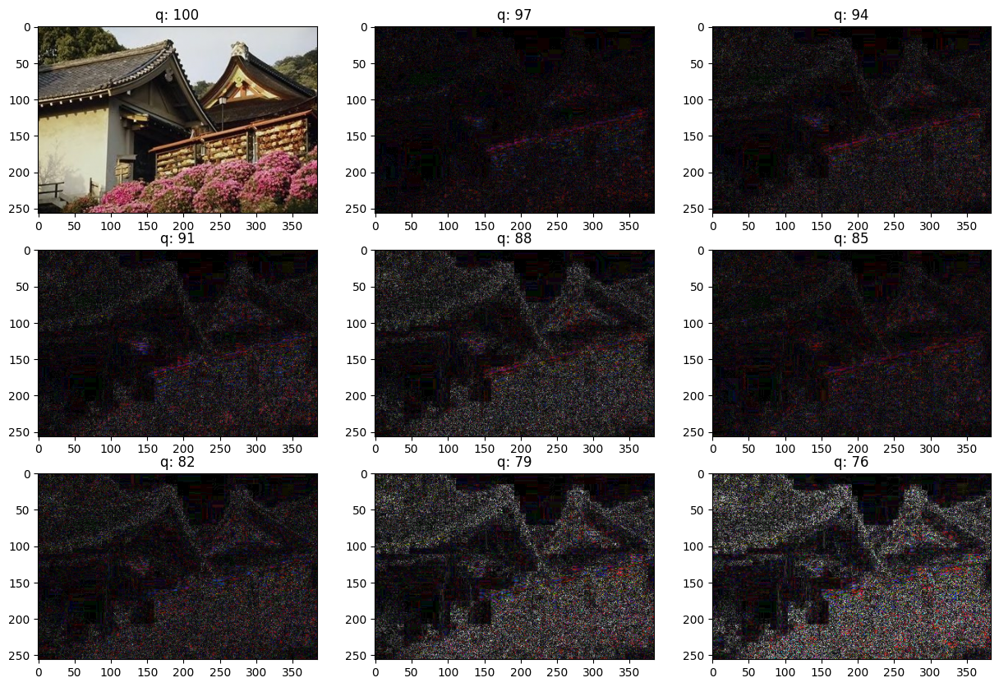

In [ ]:
import cv2
from os.path import join
from pathlib import Path
import random
import matplotlib.pyplot as plt  # Importing matplotlib.pyplot

# Assuming Config.CASIA2 and random_sample() are defined elsewhere in your code

# Your existing code continues from here
p = join(Config.CASIA2, 'Au/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig = plt.figure(figsize=(15, 10))
for i in range(1, columns * rows + 1):
    quality = init_val - (i - 1) * 3
    # Assuming compute_ela_cv is defined elsewhere in your code
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()


# **Test on a tampered fake image**

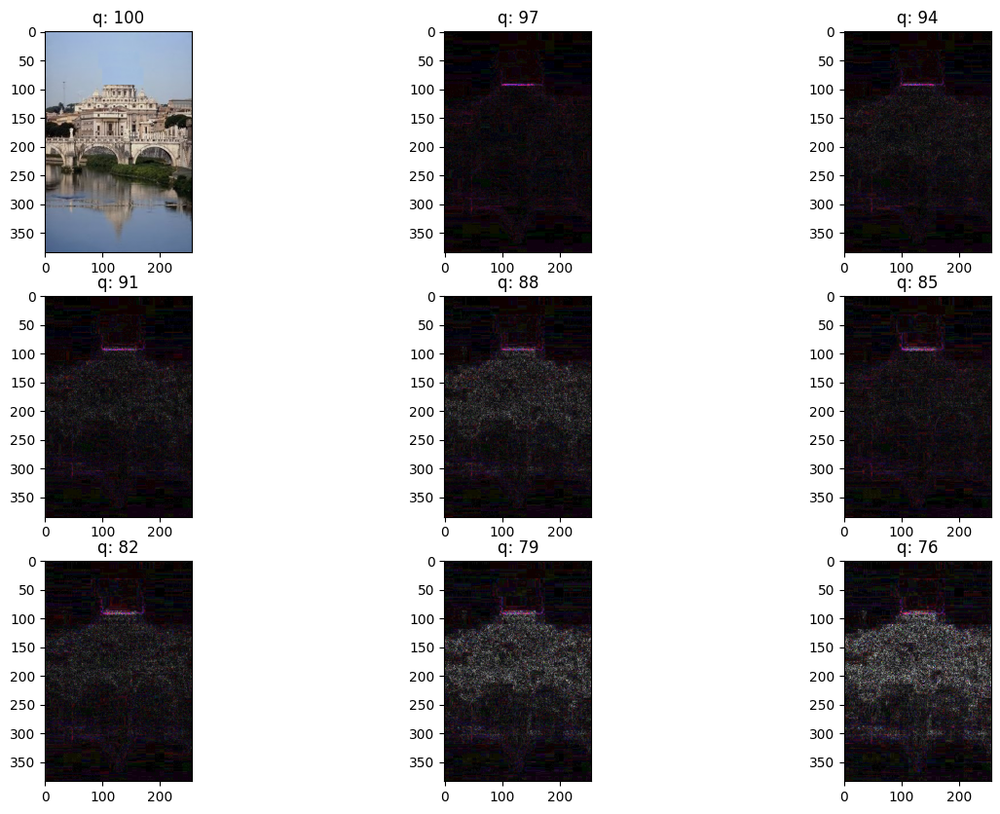

In [ ]:
p = join(Config.CASIA2, 'Tp/')
p = random_sample(p)
orig = cv2.imread(p)
orig = cv2.cvtColor(orig, cv2.COLOR_BGR2RGB) / 255.0
init_val = 100
columns = 3
rows = 3

fig=plt.figure(figsize=(15, 10))
for i in range(1, columns*rows +1):
    quality=init_val - (i-1) * 3
    img = compute_ela_cv(path=p, quality=quality)
    if i == 1:
        img = orig.copy()
    ax = fig.add_subplot(rows, columns, i)
    ax.title.set_text(f'q: {quality}')
    plt.imshow(img)
plt.show()

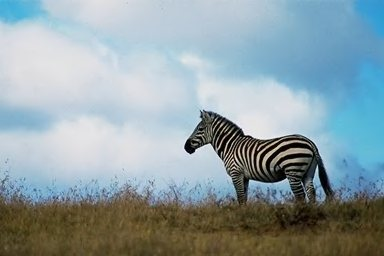

In [ ]:
real_image_path = '/kaggle/input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg'
Image.open(real_image_path)

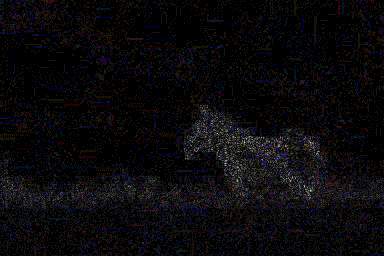

In [ ]:
convert_to_ela_image(real_image_path, 91)

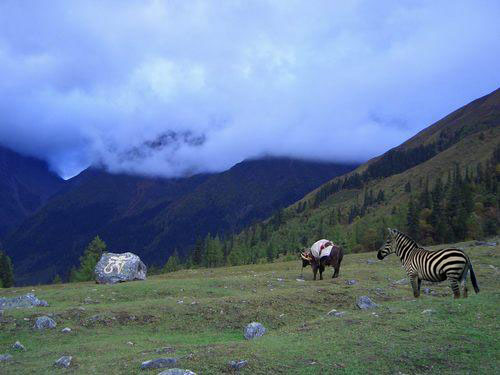

In [ ]:
fake_image_path = '/kaggle/input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
Image.open(fake_image_path)

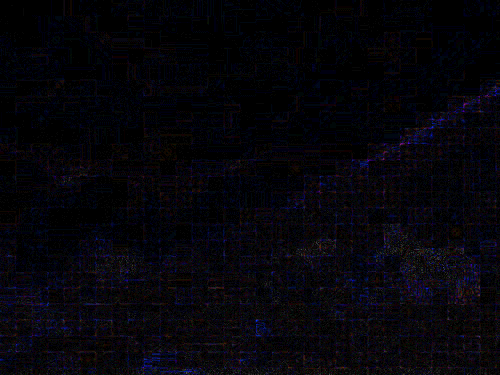

In [ ]:
convert_to_ela_image(fake_image_path, 91)

## **DENOISING REAL IMAGE**

In [ ]:
# Color-image denoising
from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage.util import random_noise
import skimage.io

img_r1 = skimage.io.imread('/kaggle/input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg')
img_r = skimage.img_as_float(img_r1)  # Converting image as float

sigma_est = estimate_sigma(img_r, channel_axis=-1, average_sigmas=True)  # Noise estimation

# Denoising using Bayes
img_bayes = denoise_wavelet(img_r, method='BayesShrink', mode='soft', wavelet_levels=3,
                             wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)

# Denoising using Visushrink
img_visushrink = denoise_wavelet(img_r, method='VisuShrink', mode='soft', sigma=sigma_est/3, wavelet_levels=5,
                                  wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)


/usr/local/lib/python3.12/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


In [ ]:
import cv2
psnr_noisy = cv2.PSNR(img_r,img_r)
psnr_noisy

361.20199909921956

In [ ]:
psnr_bayes = cv2.PSNR(img_r,img_bayes)
psnr_bayes

122.9420570855425

In [ ]:
psnr_visu = cv2.PSNR(img_r,img_visushrink)
psnr_visu

100.27511465238142

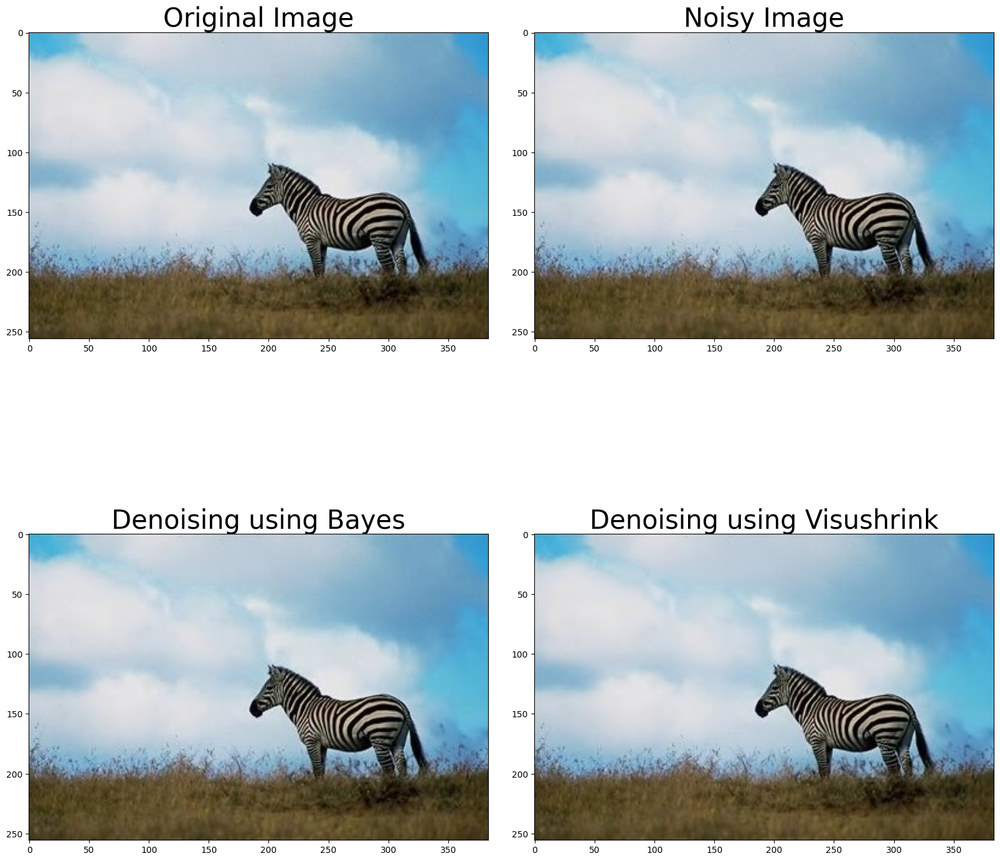

In [ ]:
plt.figure(figsize=(20,20))  # Reduced the figsize for a more compact layout

# Adjust the space between subplots
plt.subplots_adjust(wspace=0.1, hspace=0.1)

plt.subplot(2,2,1)
plt.imshow(img_r1, cmap=plt.cm.gray)
plt.title('Original Image', fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_r, cmap=plt.cm.gray)
plt.title('Noisy Image', fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes, cmap=plt.cm.gray)
plt.title('Denoising using Bayes', fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink, cmap=plt.cm.gray)
plt.title('Denoising using Visushrink', fontsize=30)

plt.show()


In [ ]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 100.27511465238142
PSNR[Original vs. Denoised(Bayes)] 122.9420570855425


## **DENOISING FAKE IMAGE**

In [ ]:
from skimage.restoration import denoise_wavelet, estimate_sigma
from skimage.util import random_noise
import skimage.io

img_f = skimage.io.imread('/kaggle/input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
img_f = skimage.img_as_float(img_f)  # Converting image as float

sigma = 0.35  # Noise
imgn = random_noise(img_f, var=sigma**2)  # Adding noise

sigma_est = estimate_sigma(img_f, channel_axis=-1, average_sigmas=True)  # Noise estimation

# Denoising using Bayes
img_bayes = denoise_wavelet(img_f, method='BayesShrink', mode='soft', wavelet_levels=3,
                             wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)

# Denoising using Visushrink
img_visushrink = denoise_wavelet(img_f, method='VisuShrink', mode='soft', sigma=sigma_est/3, wavelet_levels=5,
                                  wavelet='coif5', channel_axis=-1, convert2ycbcr=True, rescale_sigma=True)


/usr/local/lib/python3.12/dist-packages/pywt/_multilevel.py:43: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  warnings.warn(


In [ ]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [ ]:
psnr_bayes = cv2.PSNR(img_f,img_bayes)
psnr_bayes

120.58626094108669

In [ ]:
psnr_visu = cv2.PSNR(img_f,img_visushrink)
psnr_visu

97.24783471476826

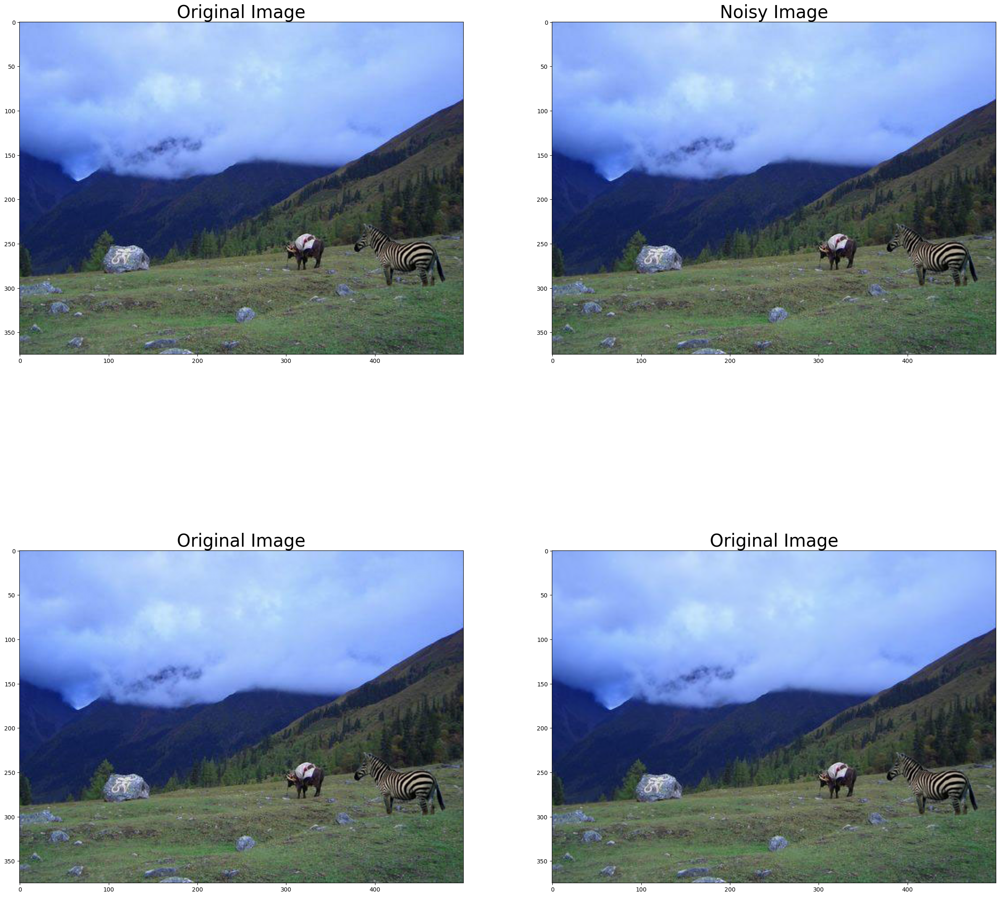

In [ ]:
# Plotting images
plt.figure(figsize=(30,30))

plt.subplot(2,2,1)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [ ]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 97.24783471476826
PSNR[Original vs. Denoised(Bayes)] 120.58626094108669


In [ ]:
# Color-image denoising
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise
# from sklearn.metrics import peak_signal_noise_ratio
import skimage.io

In [ ]:
def denoise_img(img):
    #img=skimage.io.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
    img=skimage.img_as_float(img_f) #converting image as float


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    # Denoising using Bayes
    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


    #Denoising using Visushrink
    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes

In [ ]:
image_size = (128, 128)

In [ ]:
def prepare_image(image_path):
    return np.array(convert_to_ela_image(image_path, 91).resize(image_size)).flatten() / 255.0

In [ ]:
X = [] # ELA converted images
Y = [] # 0 for fake, 1 for real

In [ ]:
import random
import numpy as np
path = '/kaggle/input/casia-dataset/CASIA2/Au/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images
Processing 1000 images
Processing 1500 images
Processing 2000 images
Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
Processing 4500 images
Processing 5000 images
Processing 5500 images
Processing 6000 images
Processing 6500 images
Processing 7000 images
2100 2100


In [ ]:
path = '/kaggle/input/casia-dataset/CASIA2/Tp/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

Processing 2500 images
Processing 3000 images
Processing 3500 images
Processing 4000 images
4164 4164


## **2. Convert Data into Arrays**
- Convert `X` into NumPy array  
- Convert `Y` into categorical (one-hot) labels  
- Reshape `X` into image format `(num_samples, 128, 128, 3)`  


In [ ]:
import numpy as np
from tensorflow.keras.utils import to_categorical


X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

## **3. Train-Validation Split**
- Split dataset into **80% training** and **20% validation**  
- Fix `random_state=5` for reproducibility  

#### **4. Verify Dataset Shapes**
- Print dataset sizes  
- Confirm compatibility with CNN input shape `(128, 128, 3)` and output classes (2)

In [ ]:
from sklearn.model_selection import train_test_split

# Assuming X and Y are already defined

X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=5)
X = X.reshape(-1, 1, 1, 1)

print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))


3331 3331
833 833


# **Build and Train Model**

In [ ]:
# ================================
# Step 0: Imports
# ================================
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.optimizers import Adam, Nadam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# ================================
# Step 1: Build Model
# ================================
def build_model():
    model = Sequential()
    model.add(Conv2D(filters=32, kernel_size=(5, 5), padding='valid',
                     activation='relu', input_shape=(128, 128, 3)))
    model.add(Conv2D(filters=32, kernel_size=(5, 5), padding='valid',
                     activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation='softmax'))  # 2-class output
    return model

# Build & view summary
model = build_model()
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 124, 124, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 120, 120, 32)   │        25,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 60, 60, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 60, 60, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    29,491,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 2)              │           514 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,520,034 (112.61 MB)

 Trainable params: 29,520,034 (112.61 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# ================================
# Step 2: Compile Model (First Pass)
# ================================
model.compile(
    loss='categorical_crossentropy',
    optimizer=Nadam(),    # Using Nadam optimizer
    metrics=['accuracy']
)

# Training settings
epochs = 24
batch_size = 10

In [ ]:
# ================================
# Step 3: Optimizer and Early Stopping
# ================================
# Define initial learning rate
init_lr = 1e-4
optimizer = Adam(learning_rate=init_lr)

early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=3,
    verbose=1,
    mode='auto'
)

In [ ]:
# ================================
# Step 4: Data Augmentation with ImageDataGenerator
# ================================

# Assuming X_train, Y_train, X_val, Y_val are already defined as numpy arrays
x_train2 = np.array(X_train, copy=True)
y_train2 = np.array(Y_train, copy=True)

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split=0.2
)

# Compute quantities required for normalization
datagen.fit(X_train)

print("Training data type:", type(X_train))

# Create generators
validation_generator = datagen.flow(x_train2, y_train2, batch_size=10, subset='validation')
train_generator = datagen.flow(x_train2, y_train2, batch_size=10, subset='training')

# Train using generator
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    verbose=1,
    callbacks=[early_stopping]
)

Training data type: <class 'numpy.ndarray'>
Epoch 1/24


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


267/267 ━━━━━━━━━━━━━━━━━━━━ 27s 74ms/step - accuracy: 0.8158 - loss: 0.6178 - val_accuracy: 0.4886 - val_loss: 0.7343
Epoch 2/24
267/267 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step - accuracy: 0.8720 - loss: 0.3813 - val_accuracy: 0.4886 - val_loss: 0.9973
Epoch 3/24
267/267 ━━━━━━━━━━━━━━━━━━━━ 14s 52ms/step - accuracy: 0.8859 - loss: 0.3083 - val_accuracy: 0.4886 - val_loss: 1.3985
Epoch 4/24
267/267 ━━━━━━━━━━━━━━━━━━━━ 21s 54ms/step - accuracy: 0.8983 - loss: 0.2779 - val_accuracy: 0.4886 - val_loss: 1.3384
Epoch 4: early stopping


In [ ]:
# ================================
# Step 5: Re-Compile with Binary Loss (optional)
# ================================
model.compile(
    optimizer=optimizer,
    loss='binary_crossentropy',
    metrics=['accuracy']
)



In [ ]:
# ================================
# Step 6: Train Model (Direct Numpy Training)
# ================================
hist = model.fit(
    X_train,
    Y_train,
    batch_size=batch_size,
    epochs=epochs,
    validation_data=(X_val, Y_val),
    callbacks=[early_stopping]
)

Epoch 1/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 16s 35ms/step - accuracy: 0.7517 - loss: 0.5338 - val_accuracy: 0.8583 - val_loss: 0.4163
Epoch 2/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step - accuracy: 0.8658 - loss: 0.3642 - val_accuracy: 0.8908 - val_loss: 0.3155
Epoch 3/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.8934 - loss: 0.2718 - val_accuracy: 0.9112 - val_loss: 0.2504
Epoch 4/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 10s 21ms/step - accuracy: 0.9066 - loss: 0.2398 - val_accuracy: 0.8800 - val_loss: 0.2835
Epoch 5/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.9177 - loss: 0.2085 - val_accuracy: 0.9124 - val_loss: 0.2286
Epoch 6/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 7s 20ms/step - accuracy: 0.9216 - loss: 0.1979 - val_accuracy: 0.9184 - val_loss: 0.2092
Epoch 7/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 11s 22ms/step - accuracy: 0.9340 - loss: 0.1734 - val_accuracy: 0.9208 - val_loss: 0.1990
Epoch 8/24
334/334 ━━━━━━━━━━━━━━━━━━━━ 9s 20ms/step - accuracy: 0.9409 - loss: 0.1548 - val_a

In [ ]:
# ================================
# Step 7: Save Model
# ================================
model.save("my_model.keras")
print("Model saved as my_model.keras")

# ================================
# Step 8: Download Model (if running in Colab)
# ================================
try:
    from google.colab import files
    files.download("my_model.keras")
except:
    print("Download only works in Colab. File saved locally instead.")

Model saved as my_model.keras


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **Accuracy vs Loss Plot**

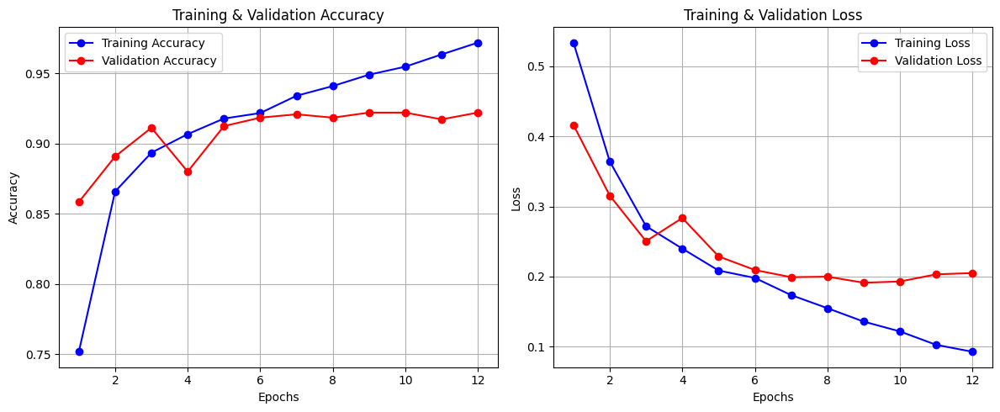

In [ ]:
# ================================
# Step 9: Plot Training History
# ================================
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Convert history.history to dictionary
    hist_dict = history.history

    # Extract values safely
    acc = hist_dict.get('accuracy', [])
    val_acc = hist_dict.get('val_accuracy', [])
    loss = hist_dict.get('loss', [])
    val_loss = hist_dict.get('val_loss', [])

    epochs_range = range(1, len(acc) + 1)

    # Plot Accuracy
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, 'bo-', label='Training Accuracy')
    plt.plot(epochs_range, val_acc, 'ro-', label='Validation Accuracy')
    plt.title('Training & Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Plot Loss
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, 'bo-', label='Training Loss')
    plt.plot(epochs_range, val_loss, 'ro-', label='Validation Loss')
    plt.title('Training & Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

# Call the function after training
plot_training_history(hist)


In [ ]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')


27/27 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


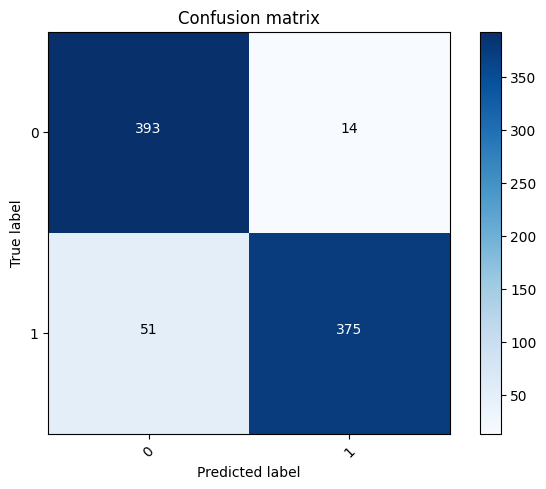

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict the values from the validation dataset
Y_pred = model.predict(X_val)
# Convert predictions classes to one hot vectors
Y_pred_classes = np.argmax(Y_pred,axis = 1)
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1)
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes)
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))

# **Model Prediction**

In [ ]:
class_names = ['fake', 'real']

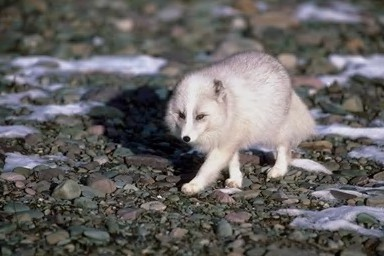

In [ ]:
real_image_path = '/kaggle/input/casia-dataset/CASIA2/Au/Au_ani_00040.jpg'
Image.open(real_image_path)

In [ ]:
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Class: real Confidence: 99.99


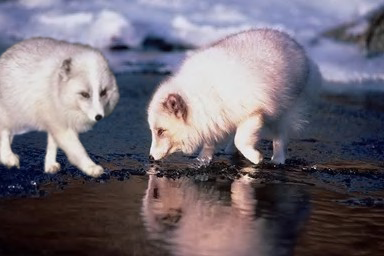

In [ ]:
fake_image_path = '/kaggle/input/casia-dataset/CASIA2/Tp/Tp_D_NRD_S_N_ani00041_ani00040_00161.tif'
Image.open(fake_image_path)

In [ ]:
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
Class: fake Confidence: 99.80


In [ ]:
fake_image = os.listdir('/kaggle/input/casia-dataset/CASIA2/Tp/')
correct = 0
total = 0
for cou, file_name in enumerate(fake_image):
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join('/kaggle/input/casia-dataset/CASIA2/Tp/', file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total += 1
        if y_pred_class == 0:
            correct += 1
            print(f'Image Count No: {cou} Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}\n')
    if cou ==500:
      break

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Image Count No: 0 Class: fake Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Image Count No: 3 Class: fake Confidence: 99.82

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
Image Count No: 7 Class: fake Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Image Count No: 8 Class: fake Confidence: 99.98

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Image Count No: 11 Class: fake Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Image Count No: 16 Class: fake Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Image Count No: 17 Class: fake Confidence: 99.94

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Image Count No: 18 Class: fake Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Image Count No: 19 Class: fake Confidence: 99.31

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Image Count No: 20 Class: fake Confidence: 99.87

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
Image Count No: 23 Class: fake Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38

In [ ]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 193, Correct: 192, Acc: 99.48186528497409


In [ ]:
real_image = os.listdir('/kaggle/input/casia-dataset/CASIA2/Au/')
correct_r = 0
total_r = 0
for cou, file_name in enumerate(real_image):
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join('/kaggle/input/casia-dataset/CASIA2/Au/', file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total_r += 1
        if y_pred_class == 1:
            correct_r += 1
            print(f'Image Count No: {cou} Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}\n')
    if cou ==500:
      break

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Image Count No: 0 Class: real Confidence: 99.96

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Image Count No: 2 Class: real Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
Image Count No: 3 Class: real Confidence: 99.82

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
Image Count No: 5 Class: real Confidence: 98.75

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step
Image Count No: 6 Class: real Confidence: 99.99

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
Image Count No: 7 Class: real Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
Image Count No: 8 Class: real Confidence: 99.78

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Image Count No: 9 Class: real Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Image Count No: 10 Class: real Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
Image Count No: 11 Class: real Confidence: 100.00

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Image Co

In [ ]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 490, Correct: 447, Acc: 91.22448979591836
Total: 683, Correct: 639, Acc: 93.55783308931186


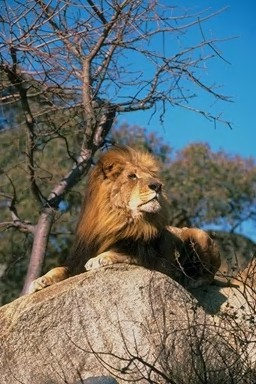

In [ ]:
image_path1 = '/kaggle/input/casia-dataset/CASIA1/Au/Au_ani_0028.jpg'
Image.open(image_path1)

In [ ]:
image = prepare_image(image_path1)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Class: real Confidence: 100.00


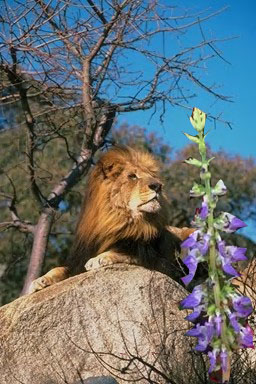

In [ ]:
image_path2 = '/kaggle/input/casia-dataset/CASIA1/Sp/Sp_D_NNN_A_ani0028_pla0007_0284.jpg'
Image.open(image_path2)

In [ ]:
image = prepare_image(image_path2)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Class: fake Confidence: 99.95


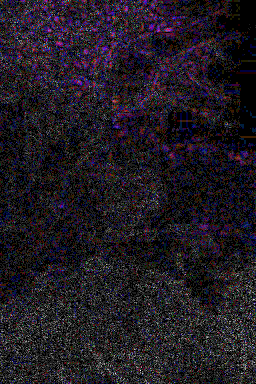

In [ ]:
convert_to_ela_image(image_path1, 91)

In [ ]:
image_1_ELA=convert_to_ela_image(image_path1, 91)

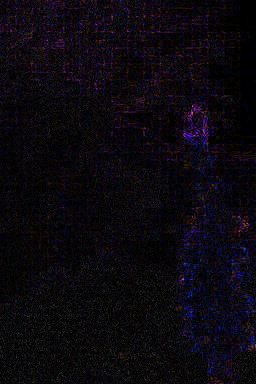

In [ ]:
convert_to_ela_image(image_path2, 91)

In [ ]:
image_2_ELA=convert_to_ela_image(image_path2, 91)

In [ ]:
ela_image = ImageChops.difference(image_1_ELA, image_2_ELA)

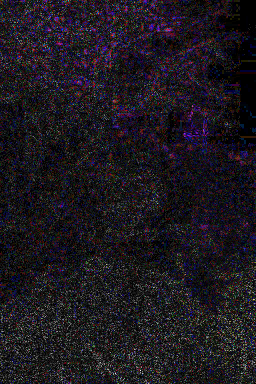

In [ ]:
ela_image

In [ ]:
print(y_pred_class)

0


In [ ]:
def find_manipulated_region(ela, threshold=50):
    mask = np.array(ela) > threshold

    # Find the bounding box of the masked region
    if np.any(mask):
        coords = np.argwhere(mask)
        return coords
    else:
        return None

In [ ]:
def make_pixels_white(img, white_coords):
    width, height = img.size
    black_img = Image.new('RGB', (width, height), color='black')
    img_arr = np.array(img)
    black_arr = np.array(black_img)
    for coord in white_coords:
        x, y, z = coord
        black_arr[x,y,:] = [255,255,255]
    mask = np.all(black_arr == [255,255,255], axis=-1)
    img_arr[mask] = [255,255,255]
    new_img = Image.fromarray(img_arr)
    return new_img

In [ ]:
if y_pred_class==0:
  ela=convert_to_ela_image(image_path2,91)
  coords=find_manipulated_region(ela)
  modify_boundary=make_pixels_white(ela,coords)
  modify_boundary.show()

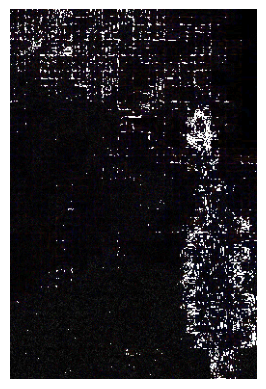

In [ ]:
import matplotlib.pyplot as plt

def find_manipulated_region(ela, threshold=50):
    ela_arr = np.array(ela)
    mask = ela_arr > threshold

    # Collapse channels → only row, col
    if np.any(mask):
        coords = np.argwhere(mask.any(axis=2))
        return coords
    else:
        return None


def make_pixels_white(img, white_coords):
    width, height = img.size
    black_img = Image.new('RGB', (width, height), color='black')
    img_arr = np.array(img)
    black_arr = np.array(black_img)

    # Mark white pixels on mask
    for x, y in white_coords:
        black_arr[x, y, :] = [255, 255, 255]

    # Apply mask to original
    mask = np.all(black_arr == [255, 255, 255], axis=-1)
    img_arr[mask] = [255, 255, 255]

    new_img = Image.fromarray(img_arr)
    return new_img




# ========================
# Usage
# ========================

if y_pred_class == 0:
    ela = convert_to_ela_image(image_path2, 91)
    coords = find_manipulated_region(ela)
    if coords is not None:
      modify_boundary = make_pixels_white(ela, coords)
      plt.imshow(modify_boundary)
      plt.axis("off")
      plt.show()
    else:
        print("⚠️ No manipulated region found")
